In [1]:
import sys; sys.path.extend(['../../../'+k for k in ['cobamp/src','cobamp-grasp/src','troppo/src']])

# Integrated parsimonious FBA

![](toy_resources/IPFBA_toy.png "Title")

In this example, we have a metabolic network with a single compartment where 6 metabolites are held in steady-state. Out of these, only E is exclusively produced inside the compartment, while the remaining 5 can be imported from outside this otherwise closed system.

Out of the 9 reactions included in this toy model, 4 are enzymatic and associated with coding genes. Furthermore, two regulator genes influence the expression of the genes associated with reactions R7 and R8.

In this tutorial, we will simulate this model using integrated parsimonious flux balance analysis (IPFBA) to predict flux distributions from gene expression profiles.

# Representing a metabolic model

We first create a ConstraintBasedModel instance to represent our metabolic model. This can be done using external frameworks such as cobrapy but for this small example, we will create a model its basic components.

The numpy and cobamp libraries are required for this step. For the latter, we may only import the ConstraintBasedModel class.

In [2]:
import pandas as pd
import numpy as np
from cobamp.core.models import ConstraintBasedModel

COBRAModelObjectReader is available for cobra
FramedModelObjectReader is available for reframed
FramedModelObjectReader could not be loaded for reframed


A metabolic model, at its core, consists of a stoichiometric matrix $S$ where each element $S_{ij}$ represents the effect of reaction $j$ on the concentration of metabolite $i$. For each reaction there is also an associated lower and upper limit for the flux value which we represent as two lower and upper bound vectors.

In [3]:
S = np.array([[1, -1, 0, 0, -1, 0, -1, 0, 0],
                [0, 1, -1, 0, 0, 0, 0, 0, 0],
                [0, 1, 0, 1, -1, 0, 0, 0, 0],
                [0, 0, 0, 0, 0, 1, -1, 0, 0],
                [0, 0, 0, 0, 0, 0, 1, -1, 0],
                [0, 0, 0, 0, 1, 0, 0, 1, -1]])

M,N = S.shape
lb = np.array([0]*N).astype(float)
lb[3] = -10
ub = np.array([10]*N).astype(float)

print(M,'metabolites','and',N,'reactions')
print((lb < 0).sum(), 'reversible reaction(s)')

6 metabolites and 9 reactions
1 reversible reaction(s)


After creating the matrices, names are also created and assigned for convenience and the gene-protein-reaction (GPR) rules are set. These rules are boolean expressions. Finally, we use all of these components to create a ConstraintBased model instance.

In [4]:
rx_names = ['R'+str(i+1) for i in range(N)]
met_names = ['A','B','C','D','E','F']

gprs = ['','G6','','','G7','','G1 or G2','(G4 and G3) or G5','']

cbm = ConstraintBasedModel(S, list(zip(lb,ub)), rx_names, met_names, gprs=gprs)

We have also already created a GPR rule container upon creating the constraint-based model. GPRs and genes can be inspected.

In [5]:
print('Metabolic genes:',cbm.gpr.get_genes())
for rn, gpr in zip(cbm.reaction_names, cbm.gpr):
    print(rn,':',gpr)

Metabolic genes: ('G3', 'G5', 'G4', 'G2', 'G6', 'G1', 'G7')
R1 : 
R2 : G6
R3 : 
R4 : 
R5 : G7
R6 : 
R7 : G1 or G2
R8 : G5 or (G3 and G4)
R9 : 


This model can be simulated using flux balance analysis. In the example below, we obtain a flux distribution by maximizing reaction $R_9$. However, we are not able to superimpose transcriptomics data easily using this method.

In [6]:
sol = cbm.optimize({'R9': 1})
sol.to_series()

R1    10.0
R2     0.0
R3    -0.0
R4    10.0
R5    10.0
R6     0.0
R7     0.0
R8     0.0
R9    10.0
dtype: float64

# Causal network

The next step of this pipeline involves the representation of gene expression regulation. GPR rules do not contain the T1 and T2 genes since these are not connected to any reaction directly. However, they regulate genes that code for enzymes capable of carrying out reactions and in larger cases make up a regulatory network that is as intricate as its metabolic counterpart.

For this part, we mainly use cobamp-grasp (imported using the *imgrasp* name)

In [7]:
from imgrasp.graph.io import SIFParser
from imgrasp.integration.models import IntegratedGPRCausalModel
from imgrasp.integration.simulation import LooplessIPFBA, ipfba_default_objective_factory, ipfba_default_objective_weights
import pandas as pd

We first create a network in simple interaction file (SIF) format and parse it using the *SIFParser* class. A graph object is then created which will then be integrated in the metabolic model. An example of the SIF formatted network compatible with the parser can be found in the example below.

In [8]:
causal_network = pd.DataFrame.from_dict({
    'source': ['T1', 'T2', 'T2'],
    'target': ['G1', 'G2', 'G4'],
    'weight': [1, -1, -1]
})

graph = SIFParser().parse(causal_network)

causal_network

,source,target,weight
0,T1,G1,1
1,T2,G2,-1
2,T2,G4,-1


# Integrating metabolic and regulatory networks as signalling models

All of the necessary elements to build an IPFBA model are completed and thus, we can now create an IPFBA simulator instance. We will choose Loopless IPFBA which attempts to minimize the amount of conflicting regulatory interactions for any given gene.

We first need to create an *IntegratedGPRCausalModel* which takes a *ConstraintBasedModel* and a *GenericGraph* instance. Information from both is then used to create an integrated model that spans metabolites, reactions, genes and regulators. This new model is then passed as a parameter to the IPFBA simulator class which then allows for transcriptomics integration.

In [9]:
# create a multi-layer model that merges the metabolic model
# with the causal network

igr_model = IntegratedGPRCausalModel(model=cbm, graph=graph) 

# create a simulator object that adds the IPFBA constraints
# to the integrated model
ipfba_simulator = LooplessIPFBA(icmodel=igr_model, # integrated model object
                                objectives=[], # objective expressions to constrain the solution space
                                eps=1e-4) # regulator gene activity threshold (minimum value to consider as active)

# allow at most 1% of genes to be regulated directly by both activators and inhibitors
ipfba_simulator.set_mismatch_relaxation(0.01)

(12, 18)


We can then perform a test simulation and explore the new reactions and metabolites created by the model integration algorithm.

The *objective_bounds* parameter requires a list of pairs (tuples or lists with 2 elements) where each pair is the minimum and maximum relative value each objective may carry. For example, if the first objective is a maximization, a minimum of 0.5 and a maximum of 0.7 means this same objective in the IPFBA solution will have a value between 50% and 70% of the theoretical maximum.

The *gene_constraints* and *expression_constraints* parameter control the availability of each gene to the model. Both are dictionaries that map strings (gene identifiers) with a value that represents the maximum gene "uptake" value. However, the *gene_constraints* dictionary will change the bounds of a drain reaction that makes a gene available for regulatory and metabolic activity while the *expression_constraints* dictionary only regulates the quantity of genes available to encode an enzyme

Finally, the most important part encompasses the *optimization_weights* parameter. This is a dictionary mapping reaction identifiers with an objective coefficient. Although this is approach is flexible, the goal of this formulation is to predict fluxes from gene expression and thus, we recommend using the gene pool import reactions associated with log-transformed or normalized gene scores.

For now, we will run the method without parameters to inspect the naming scheme of the reactions in the model.

In [10]:
## test run without any constraints except for the objectives
sol = ipfba_simulator.run(
    objective_bounds=ipfba_default_objective_weights,
    gene_constraints={},
    expression_constraints={},
    optimization_weights={})

sol.remaining_reactions.keys()

dict_keys(['ExGXP_T2', 'ExGXP_G5', 'ORCOMP_R5_0', 'SRI_SRI_1', 'GXD_G2', 'ExGXP_G4', 'GXD_G1', 'ExGXP_G6', 'GXD_G5', 'R4_flux_backwards', 'ExGXP_G3', 'ExGXP_T1', 'COMP_0', 'SRI_SRI_2', 'ORCOMP_R8_1', 'GXD_T1', 'ExGXP_G2', 'GXD_G4', 'GXD_G6', 'ORCOMP_R8_0', 'GXD_T2', 'SRI_SRI_0', 'ORCOMP_R7_0', 'ORCOMP_R2_0', 'GXD_G3', 'ORCOMP_R7_1', 'GXD_G7', 'ExGXP_G1', 'ExGXP_G7'])

By default, the following prefixes will be present in the integrated model:

- ExGXP_{y}: Gene pool availability for gene y. Default ranges are always from 0 to M (a big constant such as $10^3$)

- GXD_{y}: Conversion of gene pool metabolites into expressed gene metabolites which are then used by metabolic or regulatory conversions

In the following example we standardize a sequence of steps to use IPFBA from expression measurements through the *run_ipfba* function. Aside from the expression values stored in the *data* dictionary, this function also accepts a *cut_value* which sets an average expression value for which a log foldchange is calculated to serve as objective weights.

In [11]:
gcols = ['G'+str(i) for i in range(1, 8)] + ['T1','T2']

def log_clip(number, maxv):
    if number == 0:
        return -maxv
    else:
        return np.log(number)

def run_ipfba(data, cut_value, objective_bounds, pool_scale):
    exp_dict = data
    opt_weights = {'ExGXP_'+k:-log_clip(v/cut_value, 3) for k,v in exp_dict.items()}
    return ipfba_simulator.run(objective_bounds=objective_bounds, 
                    expression_constraints={k:v for k,v in exp_dict.items()}, 
                    gene_constraints={k:pool_scale*v for k,v in exp_dict.items()}, 
                    optimization_weights=opt_weights)

To analyse the outputs of IPFBA under several scenarios, a fictional dataset was created with several up and down regulation scenarios as well as gene knockouts.

In [12]:
scenarios = {k: dict(zip(gcols, v)) for k,v in 
                     {'wild-type': [2, 2, 2, 2, 2, 2, 2, 2, 2],
                      't1_down, t2_up': [2, 2, 2, 2, 2, 2, 2, 1, 3],
                      't1_down, t2_heavy_up': [2, 2, 2, 2, 2, 2, 2, 1, 6],
                      't1_up, t2_down': [2, 2, 2, 2, 2, 2, 2, 3, 1],
                      't1_up, t2_up': [2, 2, 2, 2, 2, 2, 2, 3, 3],
                     }.items()}

ko_scenarios = {gene+'_knockout':{k:scenarios['wild-type'][k] if k != gene else 0 for k in gcols} for gene in gcols}
scenarios.update(ko_scenarios)
exp_data = pd.DataFrame(scenarios).T
exp_data

,G1,G2,G3,G4,G5,G6,G7,T1,T2
wild-type,2,2,2,2,2,2,2,2,2
"t1_down, t2_up",2,2,2,2,2,2,2,1,3
"t1_down, t2_heavy_up",2,2,2,2,2,2,2,1,6
"t1_up, t2_down",2,2,2,2,2,2,2,3,1
"t1_up, t2_up",2,2,2,2,2,2,2,3,3
G1_knockout,0,2,2,2,2,2,2,2,2
G2_knockout,2,0,2,2,2,2,2,2,2
G3_knockout,2,2,0,2,2,2,2,2,2
G4_knockout,2,2,2,0,2,2,2,2,2
G5_knockout,2,2,2,2,0,2,2,2,2


These scenarios were then run through ipFBA and flux distributions were obtained and compiled in a single dataframe. To generate the objectives for ipFBA we defined an average gene expression value of 1.5 above which a gene will have a negative objective coefficient which will be minimized (making it active).

In [13]:
cut_value = 1.5
solutions = {name: run_ipfba(exd, cut_value, [(1,2)], 1) for name, exd in scenarios.items()}

metab_rx_df = pd.DataFrame({i:solution.to_series() for i,solution in solutions.items()}).T
remaining_rx_df = pd.DataFrame({i:pd.Series(solution.remaining_reactions) for i,solution in solutions.items()}).T
pred_gene_activity = remaining_rx_df[filter(lambda x: x.startswith('GXD_'), remaining_rx_df.columns)]
pred_reg_activity = remaining_rx_df[filter(lambda x: x.startswith('SRI_'), remaining_rx_df.columns)]

var_df = pd.concat([metab_rx_df, remaining_rx_df], axis=1)

Interpreting these results requires a closer look at each reaction type:

- Activity through ExGXP_y is the total amount of gene y being imported to the network. The value itself has no biological interpretation as a gene can be imported but then "consumed" by an inhibitory interaction

- Activity through GXD_y means that gene y is being expressed and either regulates another gene or is expressing an active enzyme

- COMP reactions direct 2 or more gene expression metabolites (produced by GXD reactions) towards a single enzyme isoform component metabolite. These component metabolites can then be consumed by ORCOMP reactions to produce metabolites which represent the enzyme itself (RXM metabolites).

- RXM metabolites (one per reaction) are then added as substrates for their respective reactions. This effectively binds gene expression to metabolic flux

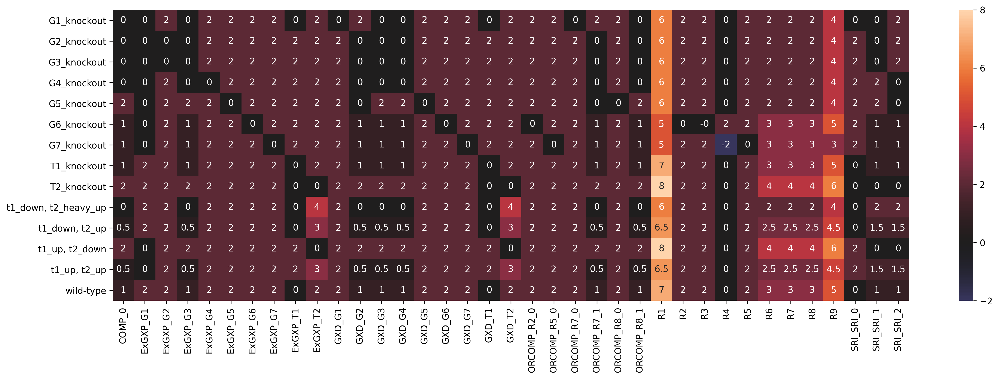

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

fig = plt.figure()
g = sns.heatmap(var_df.T.sort_index().T.sort_index().drop(columns='R4_flux_backwards'), 
                xticklabels=1, yticklabels=1, center=0, annot=True)
g.set_xticklabels(g.get_xticklabels(), rotation = 90, fontsize = 10)
fig.set_dpi(300)
fig.set_size_inches(20,6)

The *networkx* module will be used to draw graphs for each solution. The functions below are auxiliary but required to convert the output format of IPFBA into Cytoscape or networkx graphs.

In [15]:
from graph_plots import *

nodes = igr_model.metabolite_names
edge_names = igr_model.reaction_names

edge_dict = {}
edge_mapper = {}
node_value_mapper = {}

for rx, k in zip(igr_model.reaction_names, igr_model.get_stoichiometric_matrix().T):
    nzids = k.nonzero()[0]
    products = [nodes[i] for i, v in zip(nzids, k[nzids]) if v > 0]
    reactants = [nodes[i] for i, v in zip(nzids, k[nzids]) if v < 0]
    to_add = {}
    if sum([len(products), len(reactants)]) == 1:
        node_value_mapper[rx] = list(set(products) | set(reactants))[0]
    elif len(products) == 1 and len(reactants) == 1:
        to_add[rx] = (reactants[0],products[0])
    else:
        for prodrx in products:
            to_add[rx+'_product_'+prodrx] = (rx,prodrx)
        for reactrx in reactants:
            to_add[rx+'_reagent_'+reactrx] = (reactrx,rx)
    edge_mapper.update({k:rx for k in to_add.keys()})
    edge_dict.update(to_add)

edge_mapper_srs = pd.Series(edge_mapper)
edge_type = pd.DataFrame(edge_mapper_srs.copy(), columns=['name'])
edge_type['type'] = None
edge_type.loc[edge_type['name'].isin(cbm.reaction_names),'type'] = 'reaction'
edge_type.loc[edge_type['name'].apply(lambda x: x.startswith('GXD_')),'type'] = 'gene_expression'

node_var_srs = pd.Series(node_value_mapper)

In [16]:
dgraph = make_graph_from_dict(edge_dict)
node_type_mapper = pd.DataFrame(set(list(dgraph.nodes)), columns=['name']).assign(**{k:None for k in ['shape','type']})

metab_rows, reaction_rows = [node_type_mapper['name'].isin(coll) 
                                for coll in [cbm.metabolite_names, cbm.reaction_names]]

gene_expression, enzyme, gene_pools, inhibition_sinks = \
            map(lambda prfx: node_type_mapper['name'].apply(lambda x: x.startswith(prfx+'_')), 
                ['GXM','RXM','GXP','SRI'])

shape_mapping = {'metabolite':(metab_rows,'circle'),
                 'reaction':(reaction_rows,'round_rectangle'),
                 'expressed_gene':(gene_expression,'pentagon'),
                 'gene_pool':(gene_pools,'hexagon'),
                 'inhibition':(inhibition_sinks,'vee'),
                 'enzyme':(enzyme,'rectangle')}

for k,v in shape_mapping.items():
    node_type_mapper.loc[v[0], ['type','shape']] = (k, v[1])

node_type_mapper = node_type_mapper.fillna('intermediate').set_index('name')

In [17]:
nx_node_type = node_type_mapper[['shape']].replace(
    {'circle':'o', 'pentagon':'p', 'hexagon':'H', 'rectangle':'s', 
     'round_rectangle':'8', 'vee':'1','intermediate':'s'}).reset_index().groupby('shape')

## Supplementary material

A network visualization for each experimental condition can be checked below. The *networkx* library was used to generate these plots (along with *graphviz*)

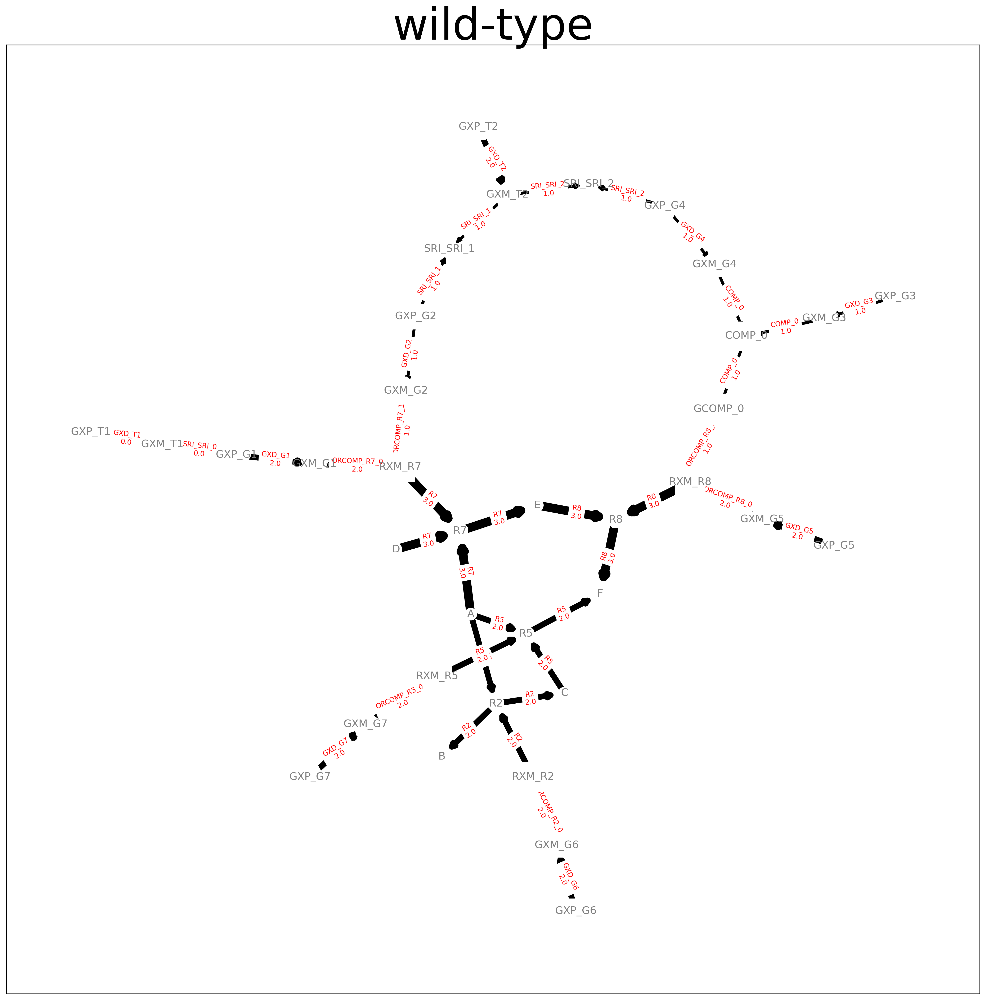

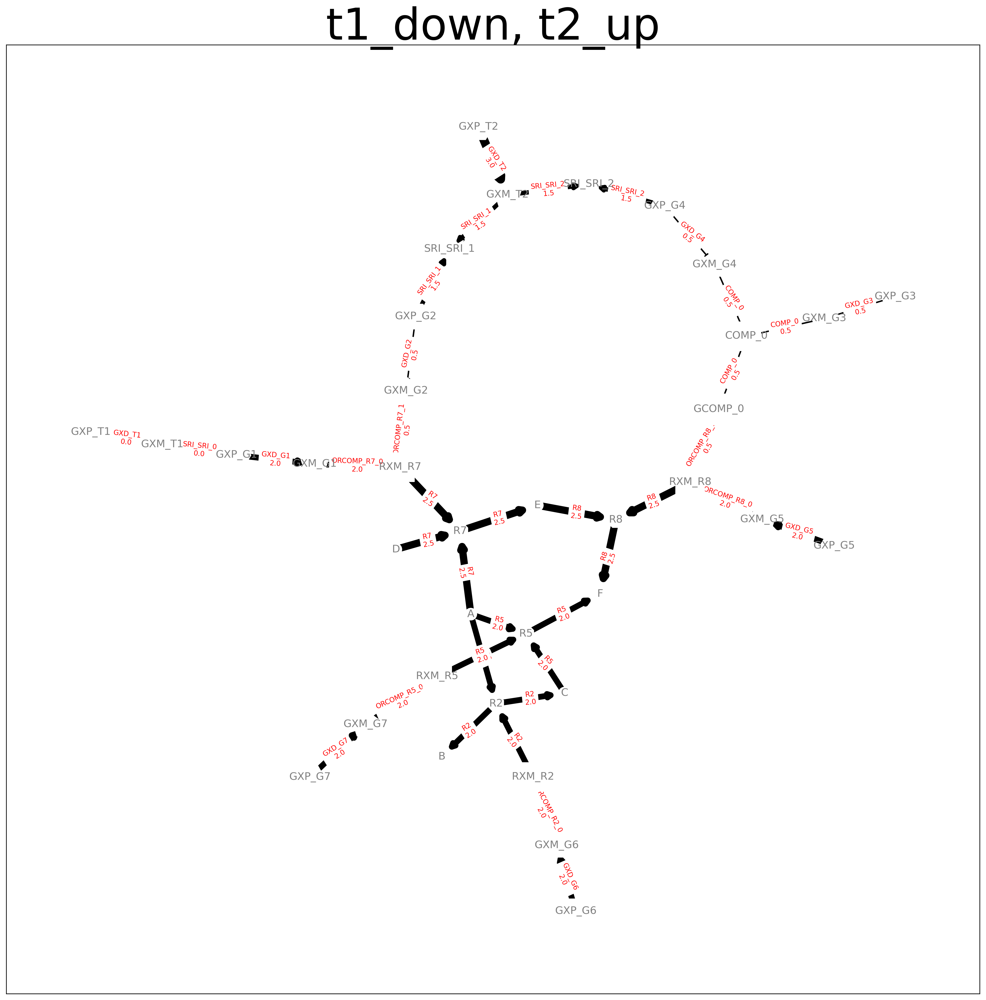

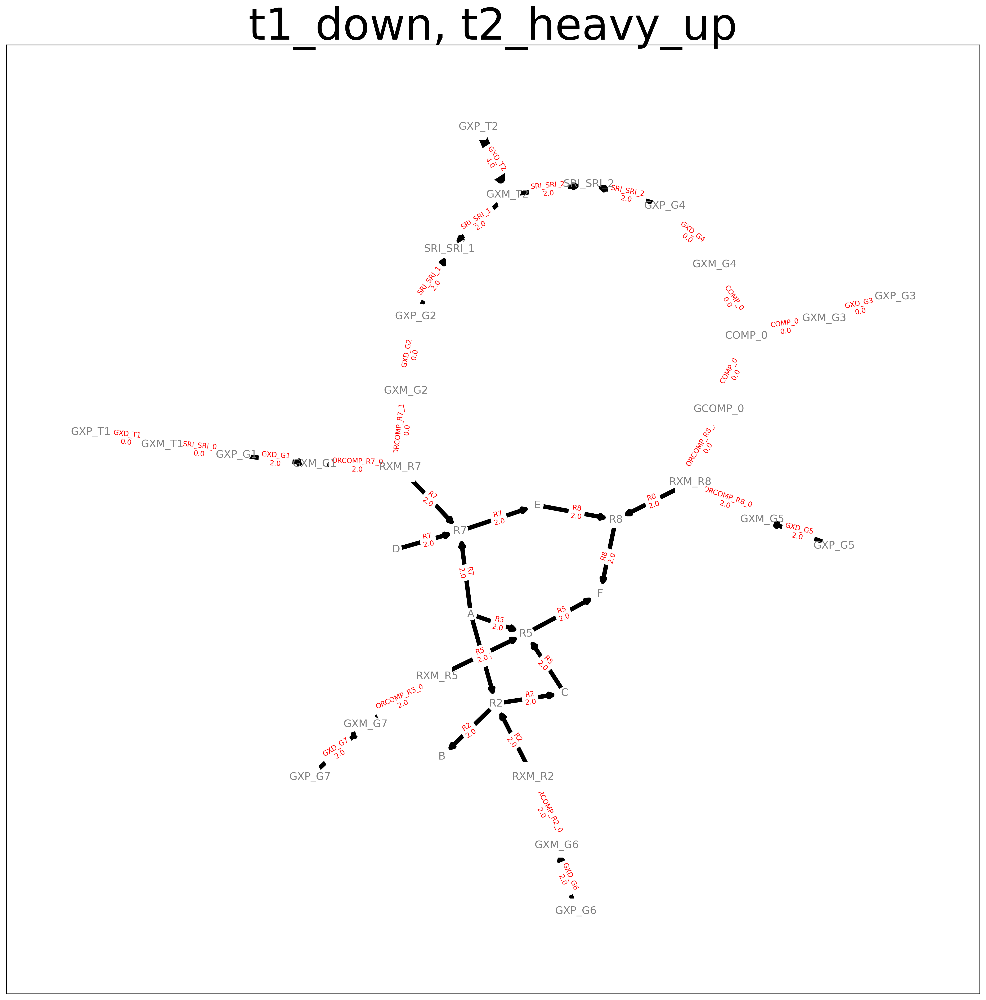

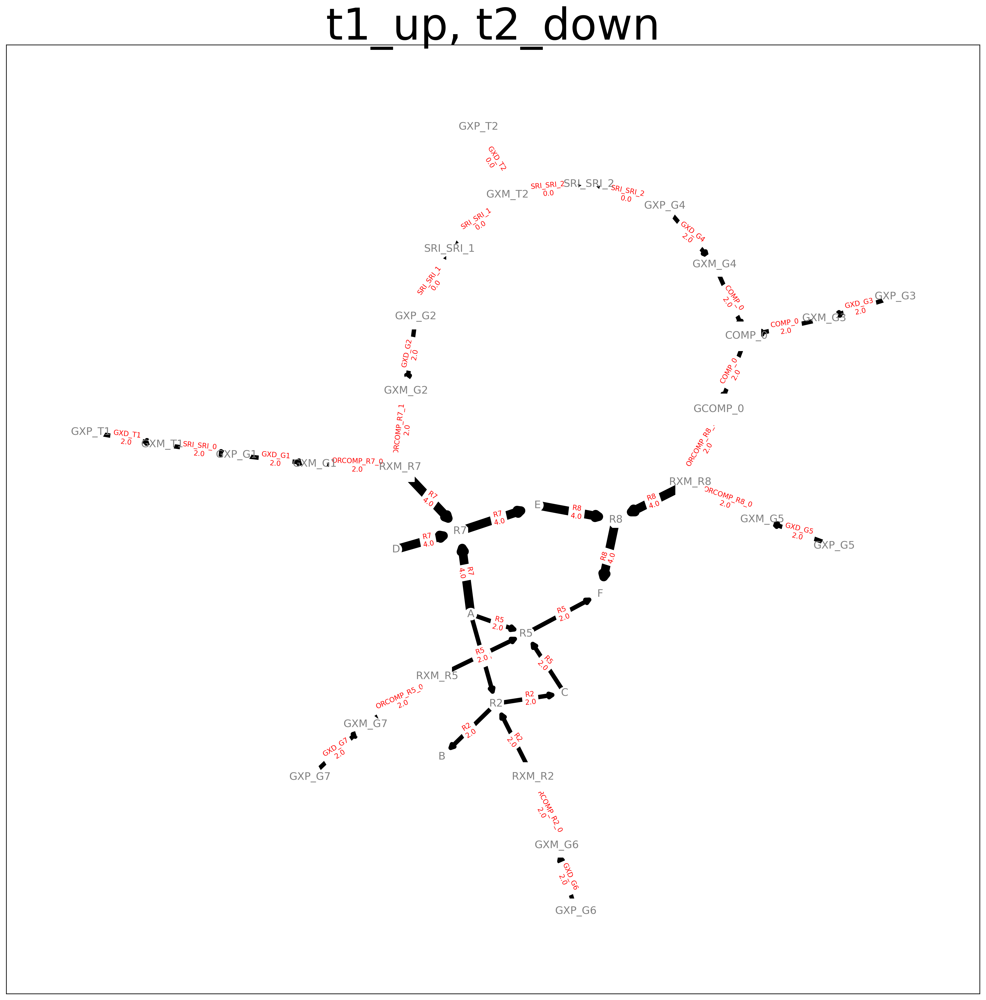

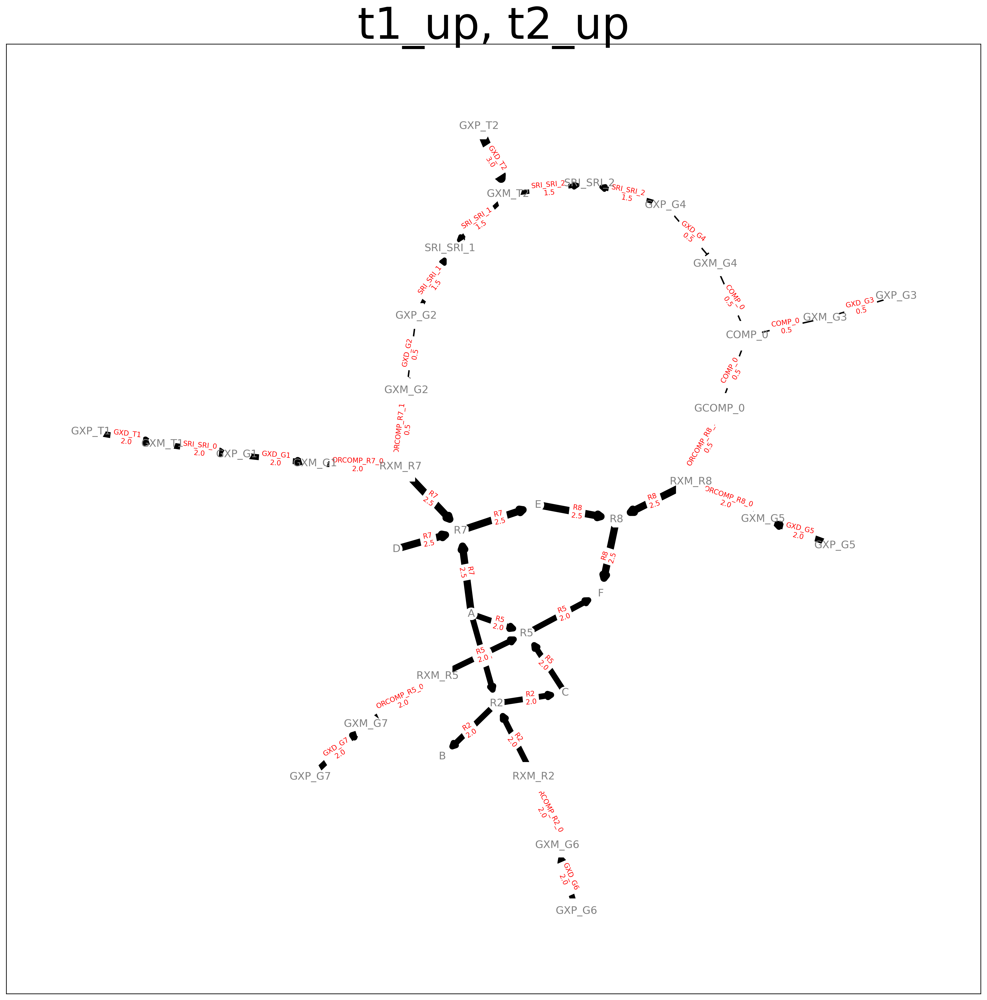

...

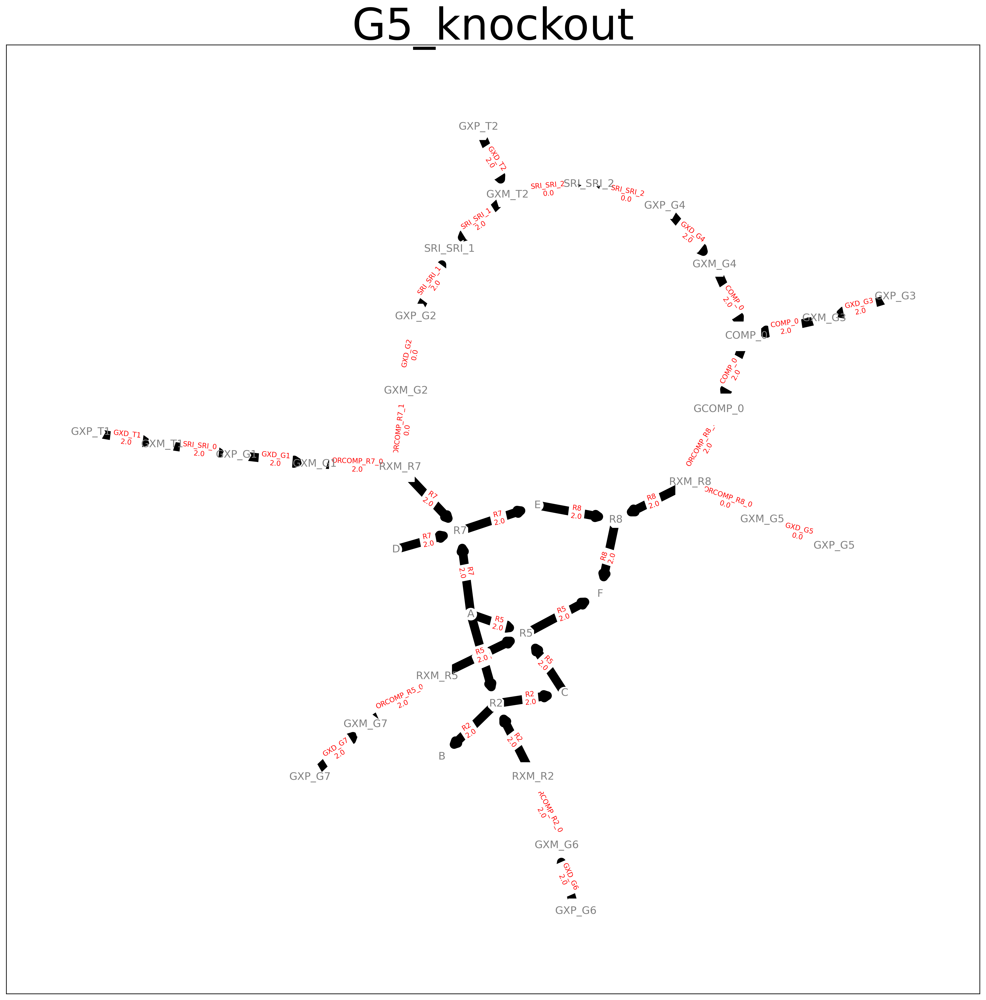

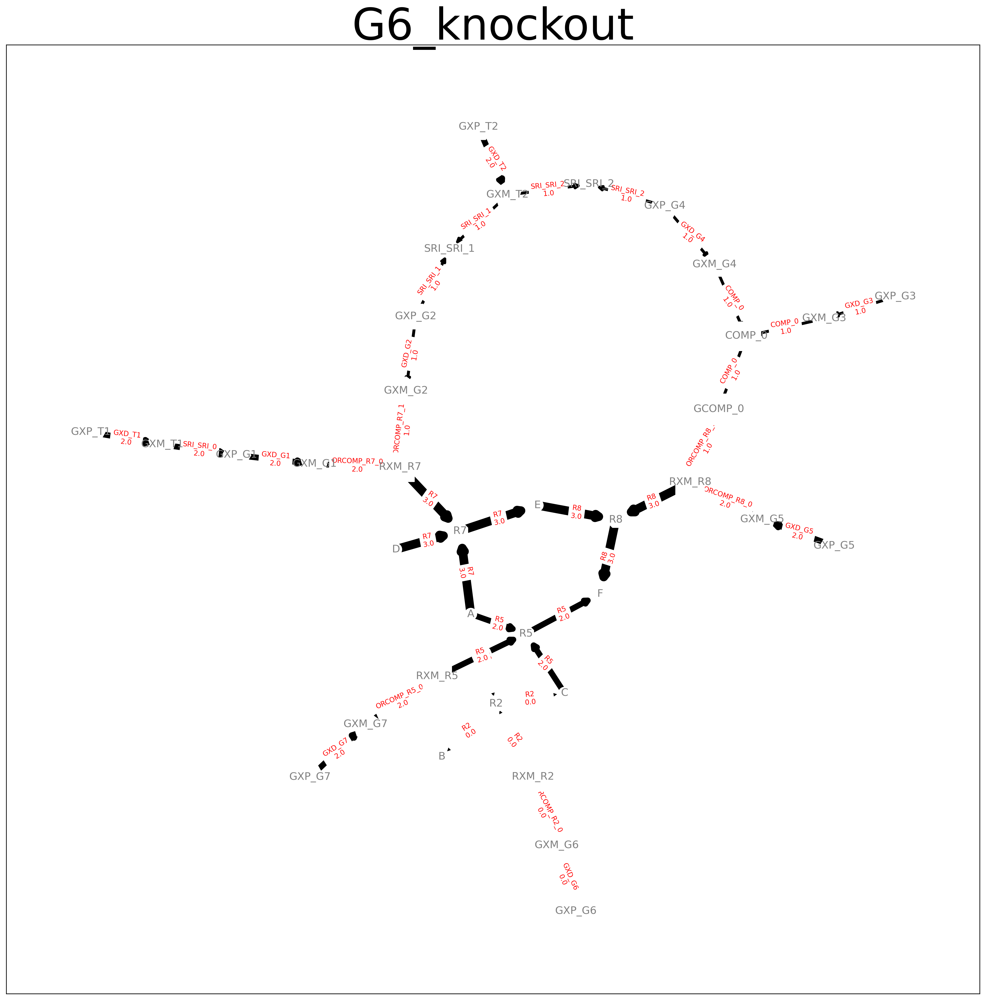

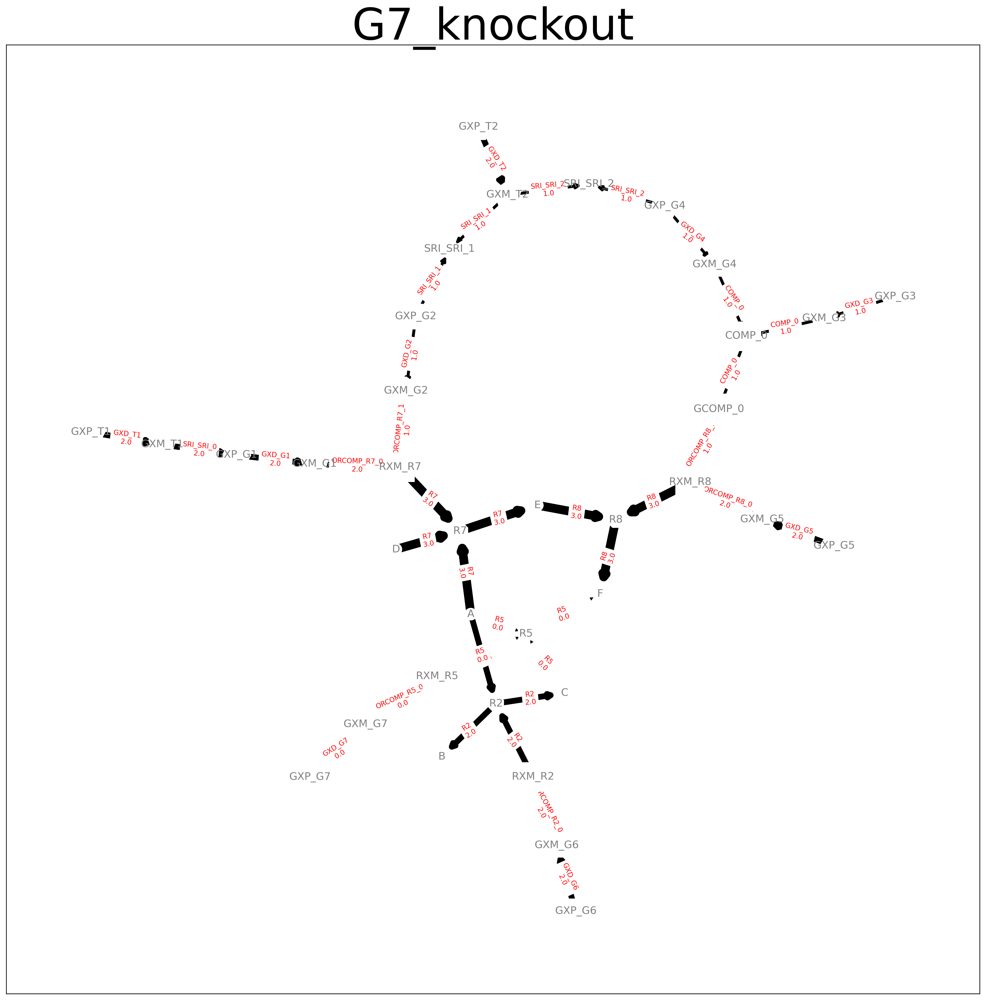

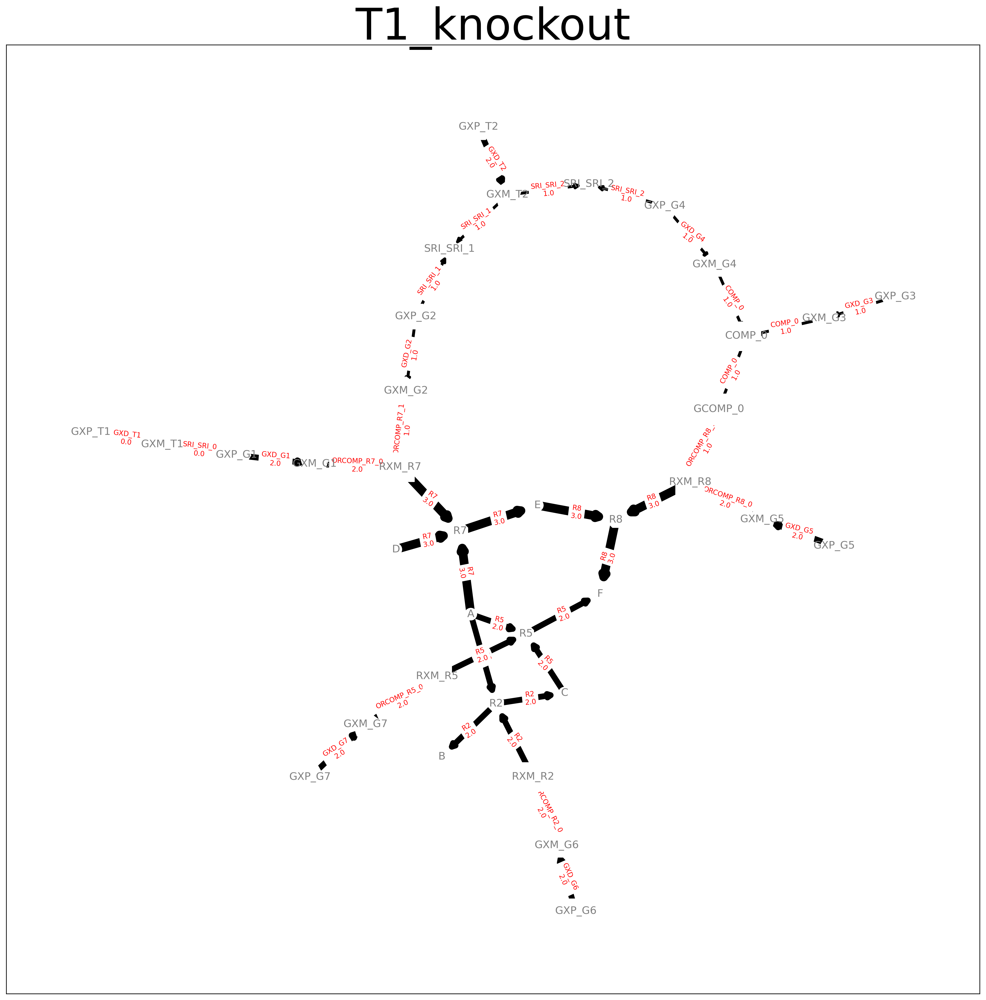

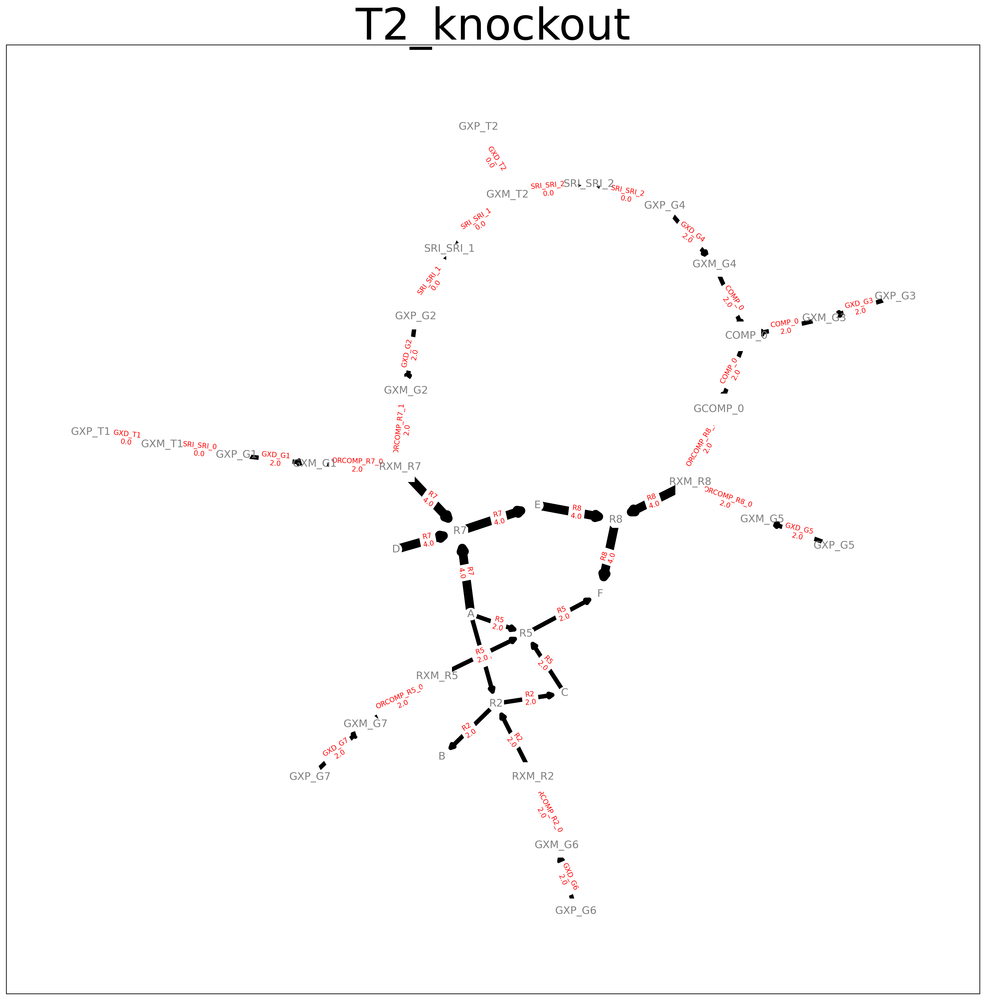

In [18]:
dpi = 300
for i, row in var_df.iterrows():
    fg = plot_solution_nx(var_df.loc[i,:], node_var_srs, nx_node_type, edge_mapper_srs, edge_dict, 
                      (0.3,10), figsize=(20,20), dpi=dpi)
    fg.axes[0].set_title(i, fontsize=dpi/6)